In [1]:
#Basic libraries
import warnings
import tensorflow as ts
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
import shap
from collections import Counter
import matplotlib.pyplot as plt
warnings.filterwarnings('ignore')
from imblearn.over_sampling import RandomOverSampler

In [2]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score,classification_report,confusion_matrix,roc_auc_score, precision_score,recall_score,f1_score

In [3]:
# Load the diabetes dataset
dataset= pd.read_csv('D:/PhD/Data Science/final_dataset.csv', sep = ',', index_col = 'id')

In [4]:
# Assume that 'Diabetes_012' is the target variable
X = dataset.drop('diabetes', axis=1)
y = dataset['diabetes']

In [5]:
from sklearn.model_selection import StratifiedShuffleSplit
# Initialize the StratifiedShuffleSplit
stratified_splitter = StratifiedShuffleSplit(n_splits=1, test_size=0.2, random_state=42)
# Iterate over the splits
for train_index, test_index in stratified_splitter.split(X, y):
    X_train, X_test = X.iloc[train_index], X.iloc[test_index]
    y_train, y_test = y.iloc[train_index], y.iloc[test_index]

In [6]:
# Split the data into training and testing sets
#X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [7]:
from catboost import CatBoostClassifier

In [8]:
# Train a CatBoost classifier
cat_model = CatBoostClassifier(random_state=42, verbose=0)
cat_model.fit(X_train, y_train)

In [9]:
# Scenario 1: Leave-One-Column-Out (LOCO)

In [10]:
# Evaluate the model on the original test set
original_accuracy = accuracy_score(y_test, cat_model.predict(X_test))
print("Original Accuracy:", original_accuracy)

Original Accuracy: 0.8320712890410659


In [11]:
loco_accuracy = {}
for feature in X.columns:
    X_test_loco = X_test.copy()
    X_test_loco[feature] = np.nan
    loco_accuracy[feature] = accuracy_score(y_test, cat_model.predict(X_test_loco))
    print(f"Accuracy with remaining features after LOCO for {feature}: {loco_accuracy[feature]}")

Accuracy with remaining features after LOCO for HighBP: 0.8293277144926582
Accuracy with remaining features after LOCO for HighChol: 0.8299422751915015
Accuracy with remaining features after LOCO for CholCheck: 0.8292838172998837
Accuracy with remaining features after LOCO for BMI: 0.8271767520467066
Accuracy with remaining features after LOCO for Smoker: 0.8307324246614429
Accuracy with remaining features after LOCO for Stroke: 0.8323127236013257
Accuracy with remaining features after LOCO for HeartDiseaseorAttack: 0.8317859572880314
Accuracy with remaining features after LOCO for PhysActivity: 0.8311274993964136
Accuracy with remaining features after LOCO for Fruits: 0.8322688264085512
Accuracy with remaining features after LOCO for Veggies: 0.8315884199205461
Accuracy with remaining features after LOCO for HvyAlcoholConsump: 0.8316323171133206
Accuracy with remaining features after LOCO for AnyHealthcare: 0.8281424902877461
Accuracy with remaining features after LOCO for NoDocbcCost

In [12]:
# Display LOCO accuracies
print("\nLOCO Accuracies:")
for feature, accuracy in loco_accuracy.items():
    impact = original_accuracy - accuracy
    print(f"{feature}: Impact = {impact}")


LOCO Accuracies:
HighBP: Impact = 0.002743574548407679
HighChol: Impact = 0.0021290138495643207
CholCheck: Impact = 0.0027874717411822125
BMI: Impact = 0.0048945369943592665
Smoker: Impact = 0.0013388643796229394
Stroke: Impact = -0.00024143456025982335
HeartDiseaseorAttack: Impact = 0.0002853317530344679
PhysActivity: Impact = 0.0009437896446522487
Fruits: Impact = -0.00019753736748528983
Veggies: Impact = 0.0004828691205197577
HvyAlcoholConsump: Impact = 0.0004389719277452242
AnyHealthcare: Impact = 0.003928798753319751
NoDocbcCost: Impact = -0.0004828691205196467
health_issue: Impact = 0.0018656306929172306
GenHlth: Impact = 0.002370448409824255
DiffWalk: Impact = 0.0003731261385834239
Sex: Impact = 0.0006145606988433583
Age: Impact = 0.0036215184038981274
Education: Impact = 0.008779438554904484
Income: Impact = 0.0018436820965299638


In [13]:
# Scenario 2: Removal-Based Explanations

In [14]:
removal_accuracy = {}
for feature in X.columns:
    X_test_removed = X_test.copy()
    X_test_removed[feature] = 0
    removal_accuracy[feature] = accuracy_score(y_test, cat_model.predict(X_test_removed))
    print(f"Accuracy with remaining features after Removal for {feature}: {removal_accuracy[feature]}")

Accuracy with remaining features after Removal for HighBP: 0.8293277144926582
Accuracy with remaining features after Removal for HighChol: 0.8299422751915015
Accuracy with remaining features after Removal for CholCheck: 0.8292838172998837
Accuracy with remaining features after Removal for BMI: 0.8271767520467066
Accuracy with remaining features after Removal for Smoker: 0.8307324246614429
Accuracy with remaining features after Removal for Stroke: 0.8323127236013257
Accuracy with remaining features after Removal for HeartDiseaseorAttack: 0.8317859572880314
Accuracy with remaining features after Removal for PhysActivity: 0.8311274993964136
Accuracy with remaining features after Removal for Fruits: 0.8322688264085512
Accuracy with remaining features after Removal for Veggies: 0.8315884199205461
Accuracy with remaining features after Removal for HvyAlcoholConsump: 0.8316323171133206
Accuracy with remaining features after Removal for AnyHealthcare: 0.8281424902877461
Accuracy with remaining

In [15]:
# Display Removal-Based Explanations accuracies
print("\nRemoval-Based Explanations Accuracies:")
for feature, accuracy in removal_accuracy.items():
    impact = original_accuracy - accuracy
    print(f"{feature}: Impact = {impact}")


Removal-Based Explanations Accuracies:
HighBP: Impact = 0.002743574548407679
HighChol: Impact = 0.0021290138495643207
CholCheck: Impact = 0.0027874717411822125
BMI: Impact = 0.0048945369943592665
Smoker: Impact = 0.0013388643796229394
Stroke: Impact = -0.00024143456025982335
HeartDiseaseorAttack: Impact = 0.0002853317530344679
PhysActivity: Impact = 0.0009437896446522487
Fruits: Impact = -0.00019753736748528983
Veggies: Impact = 0.0004828691205197577
HvyAlcoholConsump: Impact = 0.0004389719277452242
AnyHealthcare: Impact = 0.003928798753319751
NoDocbcCost: Impact = -0.0004828691205196467
health_issue: Impact = 0.0018656306929172306
GenHlth: Impact = 0.002370448409824255
DiffWalk: Impact = 0.0003731261385834239
Sex: Impact = 0.0006145606988433583
Age: Impact = 0.0036215184038981274
Education: Impact = 0.008779438554904484
Income: Impact = 0.0018436820965299638


In [16]:
print("Accuracy Score:", round(accuracy_score(y_test, cat_model.predict(X_test)) * 100, 2))
print("precision score:", round(precision_score(y_test, cat_model.predict(X_test), pos_label='positive', average='weighted') * 100, 2))
print("recall score:", round(recall_score(y_test, cat_model.predict(X_test), pos_label='positive', average='weighted') * 100, 2))
print("Roc curve:",roc_auc_score(y, cat_model.predict_proba(X), multi_class='ovr').round(4)*100)
import sklearn.metrics as metrics
print("f1 score:", metrics.f1_score(y_test, cat_model.predict(X_test), pos_label='positive', average='weighted').round(4) * 100)

Accuracy Score: 83.21
precision score: 78.37
recall score: 83.21
Roc curve: 81.23
f1 score: 79.14999999999999


In [17]:
# permutation_importance 

In [18]:
from sklearn.inspection import permutation_importance
# Calculate permutation importance
perm_importance = permutation_importance(cat_model, X_test, y_test, n_repeats=30, random_state=42)
# Get the permutation importance scores
perm_importance_scores = perm_importance.importances_mean
# Create a DataFrame to display feature names and their importance scores
perm_importance_df = pd.DataFrame({'Feature': X_test.columns, 'Importance': perm_importance_scores})
# Sort the DataFrame by importance scores in descending order
perm_importance_df = perm_importance_df.sort_values(by='Importance', ascending=False)
# Display the permutation importance results
print("\nPermutation Importance:")
print(perm_importance_df)


Permutation Importance:
                 Feature  Importance
14               GenHlth    0.007400
3                    BMI    0.006887
17                   Age    0.003532
1               HighChol    0.002772
0                 HighBP    0.002698
4                 Smoker    0.000974
15              DiffWalk    0.000909
16                   Sex    0.000839
13          health_issue    0.000748
10     HvyAlcoholConsump    0.000642
6   HeartDiseaseorAttack    0.000617
19                Income    0.000604
18             Education    0.000528
7           PhysActivity    0.000498
8                 Fruits    0.000290
2              CholCheck    0.000137
11         AnyHealthcare    0.000076
9                Veggies   -0.000052
5                 Stroke   -0.000066
12           NoDocbcCost   -0.000083


# SHAP

In [19]:
#Shap tree explainer
shap_explainer = shap.TreeExplainer(model = cat_model, model_output='margin')
shap_values = shap_explainer.shap_values(X_test)

In [20]:
#We will use below rows for prediction explanations using lime and shap
row = [100, 150,200, 250,300]

for row : 100  the real value is  0


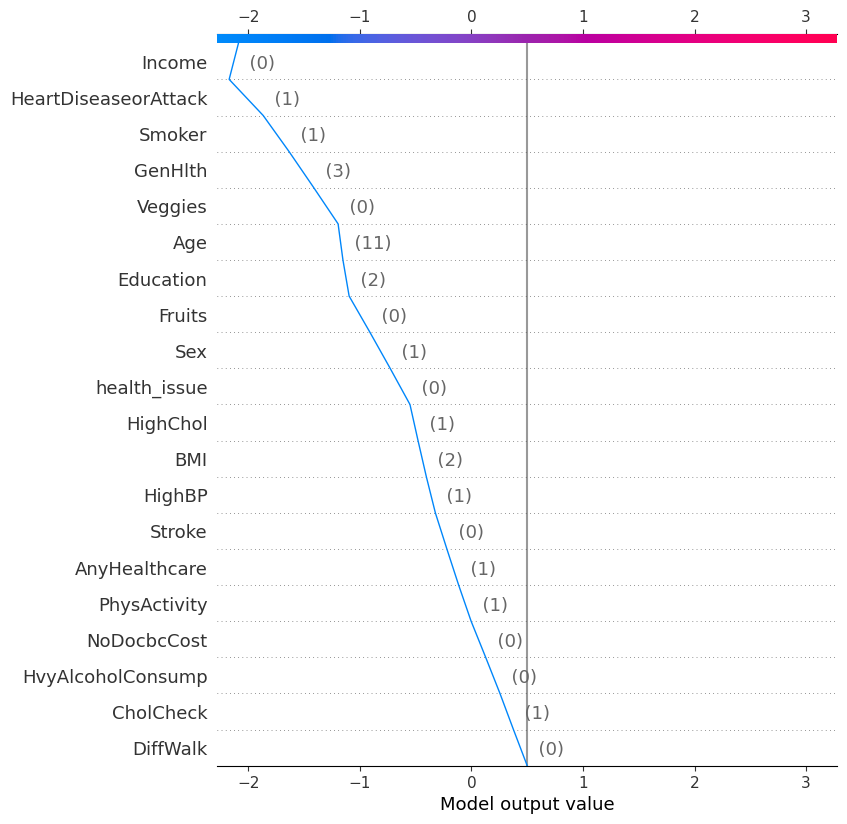

for row : 150  the real value is  0


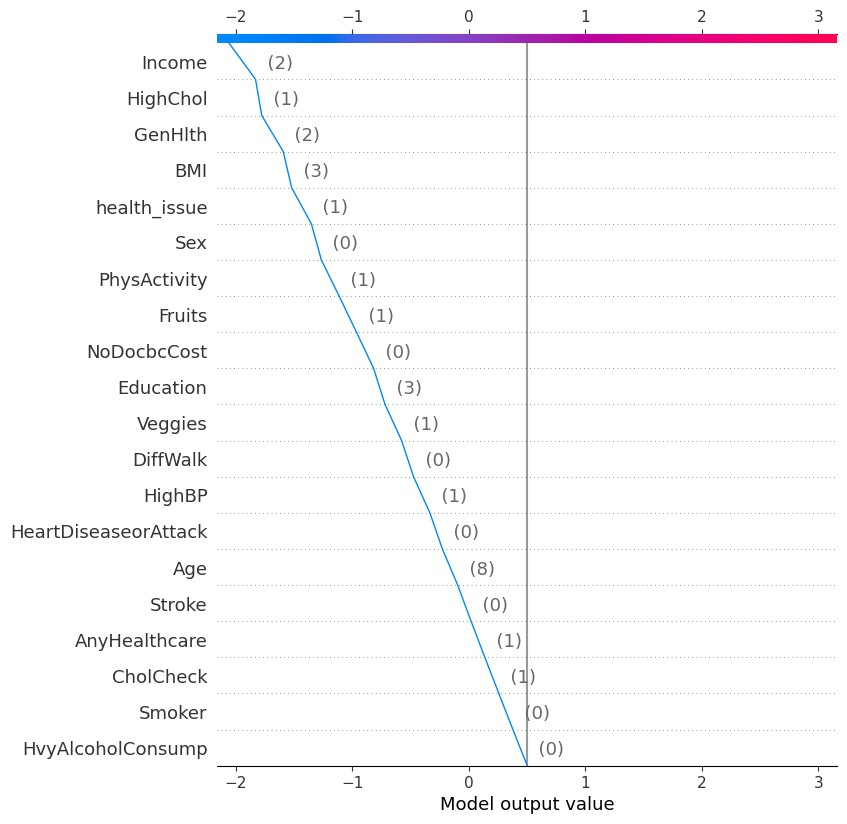

for row : 200  the real value is  0


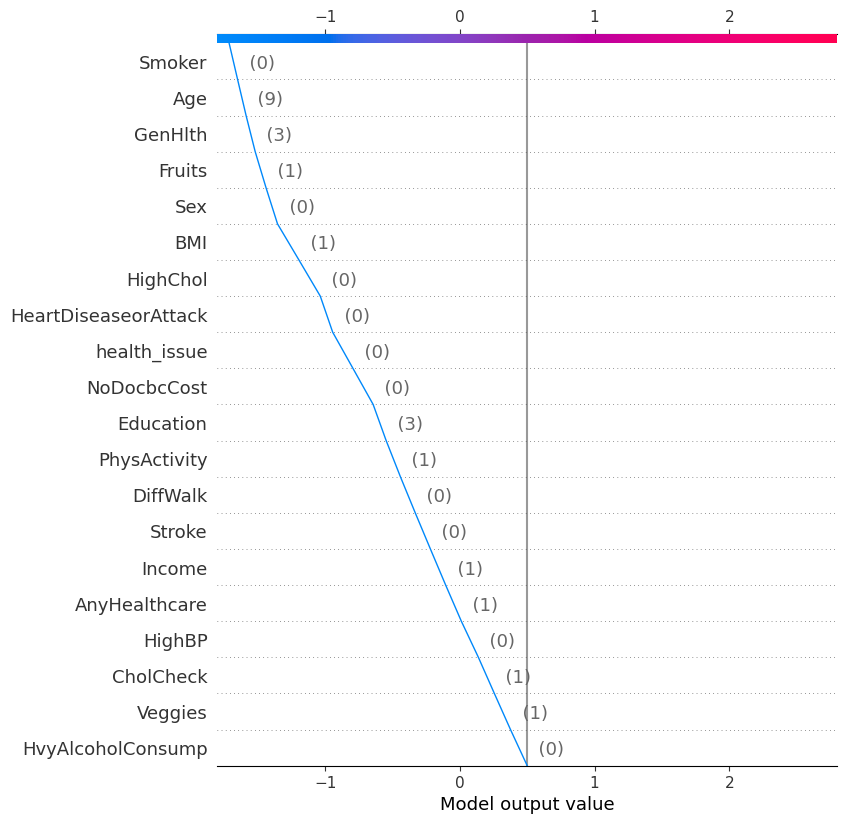

for row : 250  the real value is  0


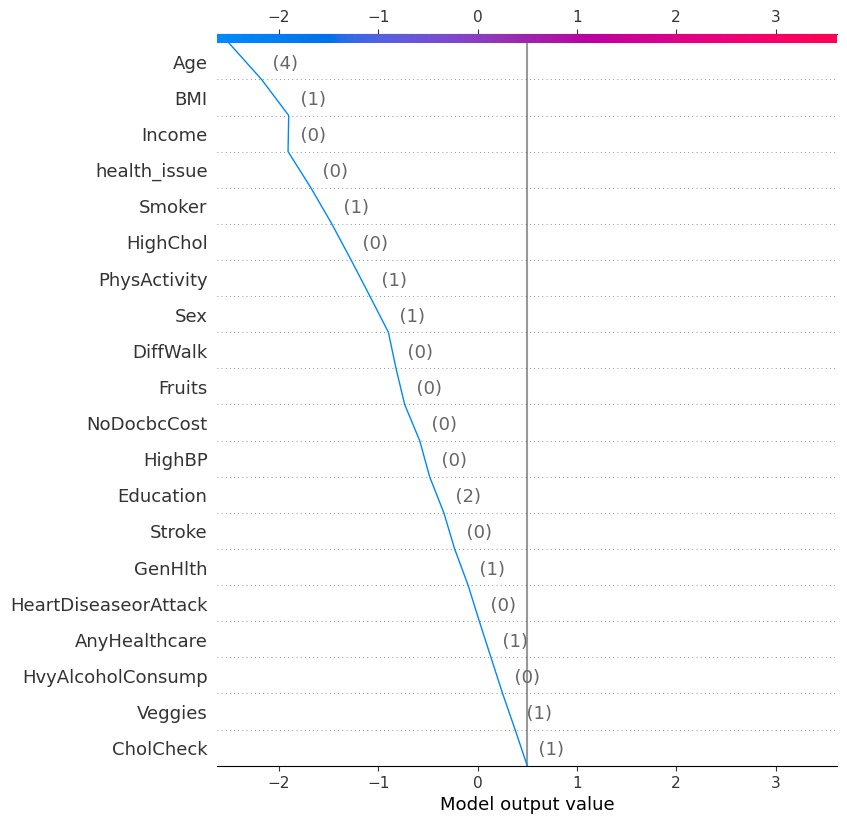

for row : 300  the real value is  2


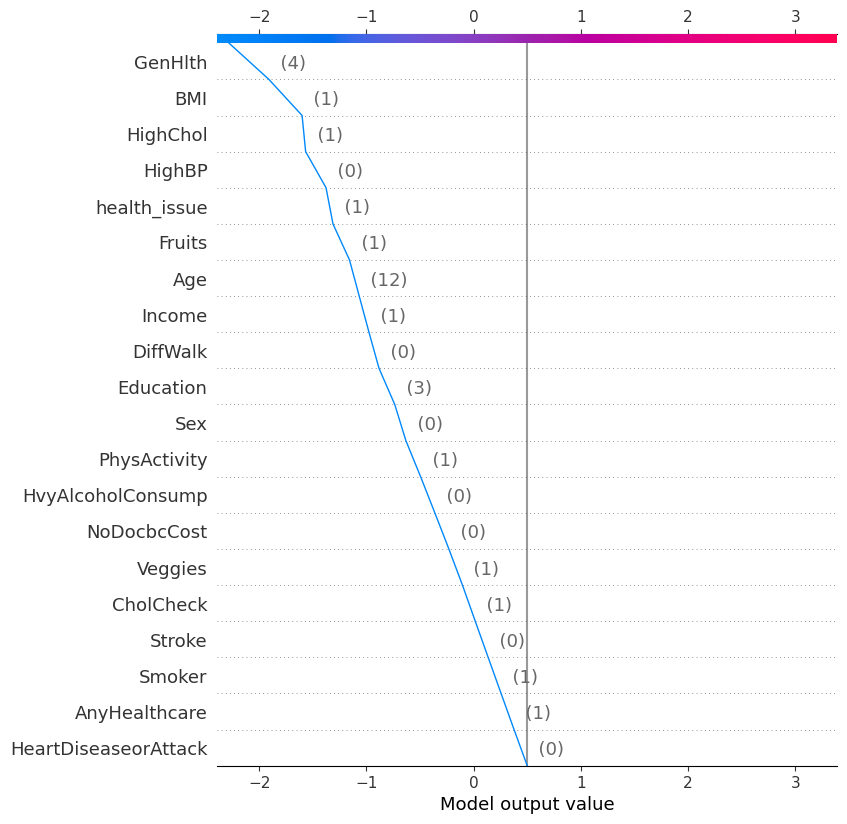

In [21]:
#Shap decision plot
for i in row:
    print("for row :",i," the real value is ", y_test.iloc[i])
    shap.decision_plot(
    base_value=shap_explainer.expected_value[1],
    shap_values=shap_values[1][i],
    features=X_test.iloc[i],
    feature_names=X_test.columns.tolist(),
    link="identity",
    new_base_value=0.5
    )

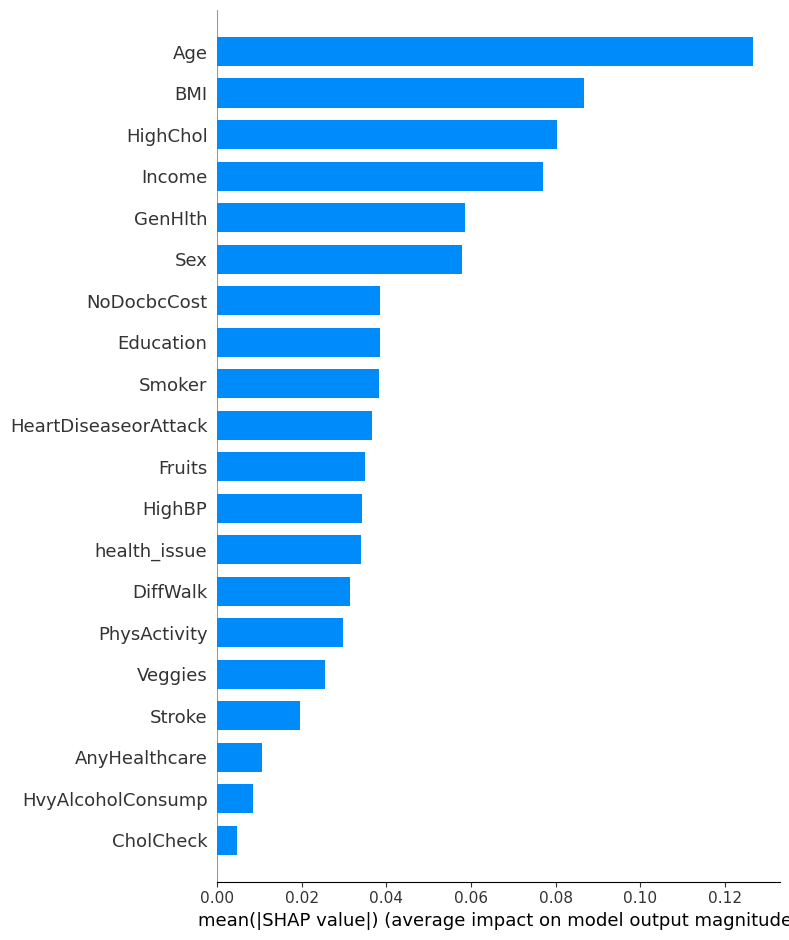

In [22]:
#bar chart
shap.summary_plot(shap_values = shap_values[1], features = X_test, max_display=20, plot_type='bar')

In [23]:
#summary plot of shap X_train
shap_values = shap_explainer.shap_values(X_train)

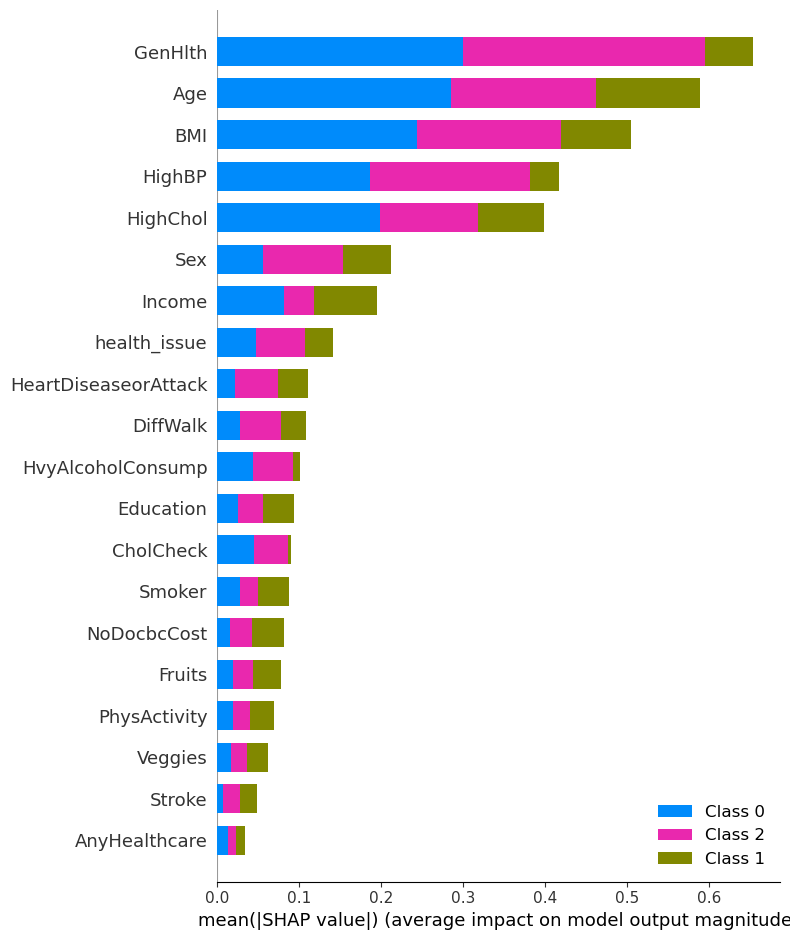

In [24]:
#shap summary plot of 
shap.summary_plot(shap_values, X_train, plot_type='bar')

# LIME

In [25]:
# importing Lime
import lime
import lime.lime_tabular
#using tabuar explainer of lime
lime_explainer = lime.lime_tabular.LimeTabularExplainer(
   X_train.values,
    training_labels=y_train.values,
    feature_names=X_train.columns.tolist(),
    feature_selection="auto",
    class_names  = ["0","1","2"],

)

In [26]:
#Explanations using lime
for i in row:
    print("for row :",i," the real value is ", y_test.iloc[i])
    exp = lime_explainer.explain_instance(X_test.iloc[i], cat_model.predict_proba, num_features=5)
    exp.show_in_notebook(show_table=True)

for row : 100  the real value is  0


for row : 150  the real value is  0


for row : 200  the real value is  0


for row : 250  the real value is  0


for row : 300  the real value is  2


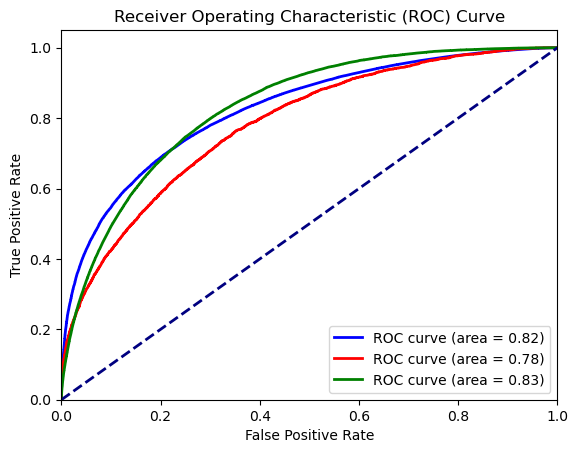

In [27]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, roc_auc_score
from sklearn.preprocessing import label_binarize
# Assuming cat_model is your model and X, y are your data and labels
# Assuming y has three classes (0, 1, and 2)
# Binarize the labels
y_bin = label_binarize(y, classes=[0, 1, 2])
# Compute ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(3):  # Assuming 3 classes
    fpr[i], tpr[i], _ = roc_curve(y_bin[:, i], cat_model.predict_proba(X)[:, i])
    roc_auc[i] = roc_auc_score(y_bin[:, i], cat_model.predict_proba(X)[:, i])
# Plot ROC curve for each class
plt.figure()
colors = ['blue', 'red', 'green']
for i, color in zip(range(3), colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=2, label='ROC curve (area = %0.2f)' % roc_auc[i])
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

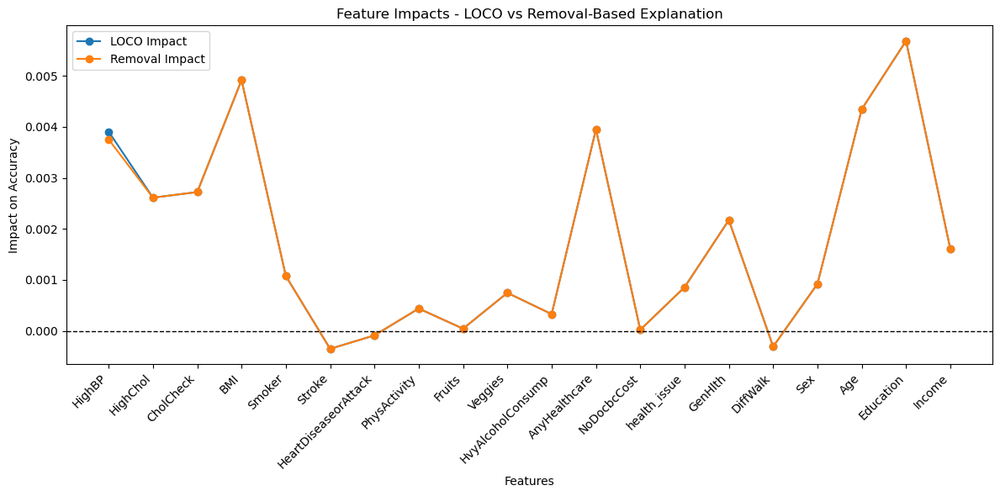

In [28]:
# LOCO impacts
loco_impacts = {
    'HighBP': 0.003906850156932484,
    'HighChol': 0.0026118829700840784,
    'CholCheck':  0.0027216259520204122,
    'BMI':  0.004916485590746533,
    'Smoker':  0.0010754812229758492,
    'Stroke': -0.00035117754219615716,
    'HeartDiseaseorAttack':-8.779438554906704e-05,
    'PhysActivity':  0.0004389719277452242,
    'Fruits':  4.389719277453352e-05,
    'Veggies':  0.0007462522771668478,
    'HvyAlcoholConsump':  0.0003292289458088904,
    'AnyHealthcare':  0.003950747349707018,
    'NoDocbcCost':  2.194859638726676e-05,
    'health_issue': 0.0008559952591031816,
    'GenHlth':  0.0021729110423388542,
    'DiffWalk':  -0.00030728034942162363,
    'Sex':  0.0009218410482649819,
    'Age':  0.0043458220846777085,
    'Education':  0.005684686464300648,
    'Income':  0.0016022475362700295
    # ... (include impacts for all features)
}
# Removal-Based Explanation impacts
removal_impacts = {
    'HighBP': 0.003753209982221728,
    'HighChol': 0.0026118829700840784,
    'CholCheck':  0.0027216259520204122,
    'BMI':0.004916485590746533,
    'Smoker':0.0010754812229758492,
    'Stroke': -0.00035117754219615716,
    'HeartDiseaseorAttack':-8.779438554906704e-05,
    'PhysActivity':  0.0004389719277452242,
    'Fruits':4.389719277453352e-05,
    'Veggies': 0.0007462522771668478,
    'HvyAlcoholConsump': 0.0003292289458088904,
    'AnyHealthcare':  0.003950747349707018,
    'NoDocbcCost':  2.194859638726676e-05,
    'health_issue':  0.0008559952591031816,
    'GenHlth':  0.0021729110423388542,
    'DiffWalk':  -0.00030728034942162363,
    'Sex':  0.0009218410482649819,
    'Age':  0.0043458220846777085,
    'Education':  0.005684686464300648,
    'Income':  0.0016022475362700295
}
# Extract feature names and their impacts
features = list(loco_impacts.keys())
loco_values = list(loco_impacts.values())
removal_values = list(removal_impacts.values())
# Plotting
plt.figure(figsize=(12, 6))
plt.plot(features, loco_values, label='LOCO Impact', marker='o')
plt.plot(features, removal_values, label='Removal Impact', marker='o')
plt.axhline(0, color='black', linestyle='--', linewidth=1)  # Zero line for reference
plt.title('Feature Impacts - LOCO vs Removal-Based Explanation')
plt.xlabel('Features')
plt.ylabel('Impact on Accuracy')
plt.legend()
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

In [29]:
from imblearn.combine import SMOTETomek
Resample= SMOTETomek(sampling_strategy='not minority',random_state=10)
x_train,y_train=Resample.fit_resample(X_train,y_train)

In [30]:
# Train a CatBoost classifier
cat_model = CatBoostClassifier(random_state=42, verbose=0)
cat_model.fit(x_train, y_train)

In [31]:
# Scenario 1: Leave-One-Column-Out (LOCO)

In [32]:
# Evaluate the model on the original test set
original_accuracy = accuracy_score(y_test, cat_model.predict(X_test))
print("Original Accuracy:", original_accuracy)

Original Accuracy: 0.6977019819582537


In [33]:
loco_accuracy = {}
for feature in X.columns:
    X_test_loco = X_test.copy()
    X_test_loco[feature] = np.nan
    loco_accuracy[feature] = accuracy_score(y_test, cat_model.predict(X_test_loco))
    print(f"Accuracy with remaining features after LOCO for {feature}: {loco_accuracy[feature]}")

Accuracy with remaining features after LOCO for HighBP: 0.7494787208358026
Accuracy with remaining features after LOCO for HighChol: 0.7252913676170409
Accuracy with remaining features after LOCO for CholCheck: 0.8172998836724391
Accuracy with remaining features after LOCO for BMI: 0.8082790105572749
Accuracy with remaining features after LOCO for Smoker: 0.6846645157042207
Accuracy with remaining features after LOCO for Stroke: 0.6946730756568118
Accuracy with remaining features after LOCO for HeartDiseaseorAttack: 0.6977019819582537
Accuracy with remaining features after LOCO for PhysActivity: 0.6843572353547991
Accuracy with remaining features after LOCO for Fruits: 0.6847303614933825
Accuracy with remaining features after LOCO for Veggies: 0.6935317486446742
Accuracy with remaining features after LOCO for HvyAlcoholConsump: 0.686705735168236
Accuracy with remaining features after LOCO for AnyHealthcare: 0.6995237154583964
Accuracy with remaining features after LOCO for NoDocbcCost:

In [34]:
# Display LOCO accuracies
print("\nLOCO Accuracies:")
for feature, accuracy in loco_accuracy.items():
    impact = original_accuracy - accuracy
    print(f"{feature}: Impact = {impact}")


LOCO Accuracies:
HighBP: Impact = -0.051776738877548856
HighChol: Impact = -0.027589385658787213
CholCheck: Impact = -0.11959790171418538
BMI: Impact = -0.11057702859902119
Smoker: Impact = 0.013037466254033014
Stroke: Impact = 0.003028906301441925
HeartDiseaseorAttack: Impact = 0.0
PhysActivity: Impact = 0.013344746603454638
Fruits: Impact = 0.012971620464871214
Veggies: Impact = 0.004170233313579574
HvyAlcoholConsump: Impact = 0.01099624679001776
AnyHealthcare: Impact = -0.001821733500142697
NoDocbcCost: Impact = 0.006474835934241918
health_issue: Impact = 0.018634358332784595
GenHlth: Impact = -0.10302671144180331
DiffWalk: Impact = 0.0023046026206623438
Sex: Impact = -0.014946994139724779
Age: Impact = -0.12528258817848603
Education: Impact = -0.05855885516121251
Income: Impact = 0.051381664142578054


In [35]:
# Scenario 2: Removal-Based Explanations

In [36]:
removal_accuracy = {}
for feature in X.columns:
    X_test_removed = X_test.copy()
    X_test_removed[feature] = 0
    removal_accuracy[feature] = accuracy_score(y_test, cat_model.predict(X_test_removed))
    print(f"Accuracy with remaining features after Removal for {feature}: {removal_accuracy[feature]}")

Accuracy with remaining features after Removal for HighBP: 0.7494787208358026
Accuracy with remaining features after Removal for HighChol: 0.7252913676170409
Accuracy with remaining features after Removal for CholCheck: 0.8172998836724391
Accuracy with remaining features after Removal for BMI: 0.8082790105572749
Accuracy with remaining features after Removal for Smoker: 0.6846645157042207
Accuracy with remaining features after Removal for Stroke: 0.6946730756568118
Accuracy with remaining features after Removal for HeartDiseaseorAttack: 0.6977019819582537
Accuracy with remaining features after Removal for PhysActivity: 0.6843572353547991
Accuracy with remaining features after Removal for Fruits: 0.6847303614933825
Accuracy with remaining features after Removal for Veggies: 0.6935317486446742
Accuracy with remaining features after Removal for HvyAlcoholConsump: 0.686705735168236
Accuracy with remaining features after Removal for AnyHealthcare: 0.6995237154583964
Accuracy with remaining 

In [37]:
# Display Removal-Based Explanations accuracies
print("\nRemoval-Based Explanations Accuracies:")
for feature, accuracy in removal_accuracy.items():
    impact = original_accuracy - accuracy
    print(f"{feature}: Impact = {impact}")


Removal-Based Explanations Accuracies:
HighBP: Impact = -0.051776738877548856
HighChol: Impact = -0.027589385658787213
CholCheck: Impact = -0.11959790171418538
BMI: Impact = -0.11057702859902119
Smoker: Impact = 0.013037466254033014
Stroke: Impact = 0.003028906301441925
HeartDiseaseorAttack: Impact = 0.0
PhysActivity: Impact = 0.013344746603454638
Fruits: Impact = 0.012971620464871214
Veggies: Impact = 0.004170233313579574
HvyAlcoholConsump: Impact = 0.01099624679001776
AnyHealthcare: Impact = -0.001821733500142697
NoDocbcCost: Impact = 0.006474835934241918
health_issue: Impact = 0.018634358332784595
GenHlth: Impact = -0.10302671144180331
DiffWalk: Impact = 0.0023046026206623438
Sex: Impact = -0.014946994139724779
Age: Impact = -0.12528258817848603
Education: Impact = -0.05855885516121251
Income: Impact = 0.051381664142578054


In [38]:
print("Accuracy Score:", round(accuracy_score(y_test, cat_model.predict(X_test)) * 100, 2))
print("precision score:", round(precision_score(y_test, cat_model.predict(X_test), pos_label='positive', average='weighted') * 100, 2))
print("recall score:", round(recall_score(y_test, cat_model.predict(X_test), pos_label='positive', average='weighted') * 100, 2))
print("Roc curve:",roc_auc_score(y, cat_model.predict_proba(X), multi_class='ovr').round(4)*100)
import sklearn.metrics as metrics
print("f1 score:", metrics.f1_score(y_test, cat_model.predict(X_test), pos_label='positive', average='weighted').round(4) * 100)

Accuracy Score: 69.77
precision score: 81.23
recall score: 69.77
Roc curve: 80.08999999999999
f1 score: 72.89


In [39]:
# permutation_importance 

In [40]:
from sklearn.inspection import permutation_importance
# Calculate permutation importance
perm_importance = permutation_importance(cat_model, X_test, y_test, n_repeats=30, random_state=42)
# Get the permutation importance scores
perm_importance_scores = perm_importance.importances_mean
# Create a DataFrame to display feature names and their importance scores
perm_importance_df = pd.DataFrame({'Feature': X_test.columns, 'Importance': perm_importance_scores})
# Sort the DataFrame by importance scores in descending order
perm_importance_df = perm_importance_df.sort_values(by='Importance', ascending=False)
# Display the permutation importance results
print("\nPermutation Importance:")
print(perm_importance_df)


Permutation Importance:
                 Feature  Importance
14               GenHlth    0.018350
3                    BMI    0.008327
17                   Age    0.004698
1               HighChol    0.002864
10     HvyAlcoholConsump    0.002415
4                 Smoker    0.002160
8                 Fruits    0.001227
9                Veggies    0.000194
0                 HighBP    0.000078
11         AnyHealthcare   -0.000291
16                   Sex   -0.000484
5                 Stroke   -0.000551
6   HeartDiseaseorAttack   -0.000920
7           PhysActivity   -0.000931
2              CholCheck   -0.001143
15              DiffWalk   -0.002016
12           NoDocbcCost   -0.002186
13          health_issue   -0.002959
18             Education   -0.003310
19                Income   -0.005699


# SHAP

In [41]:
#Shap tree explainer
shap_explainer = shap.TreeExplainer(model = cat_model, model_output='margin')
shap_values = shap_explainer.shap_values(X_test)

for row : 100  the real value is  0


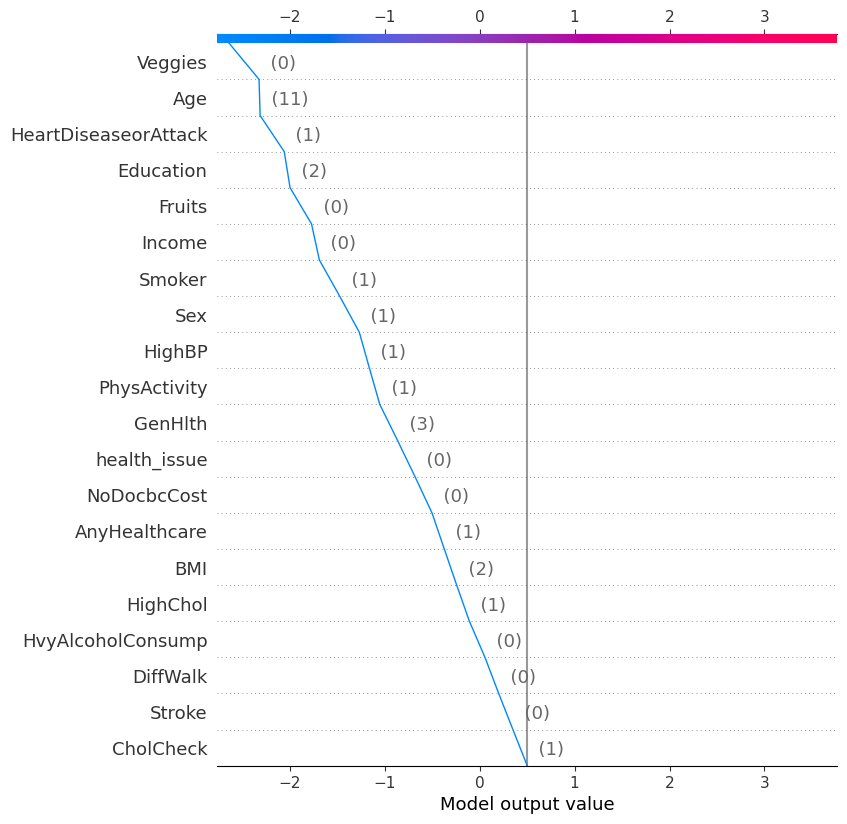

for row : 150  the real value is  0


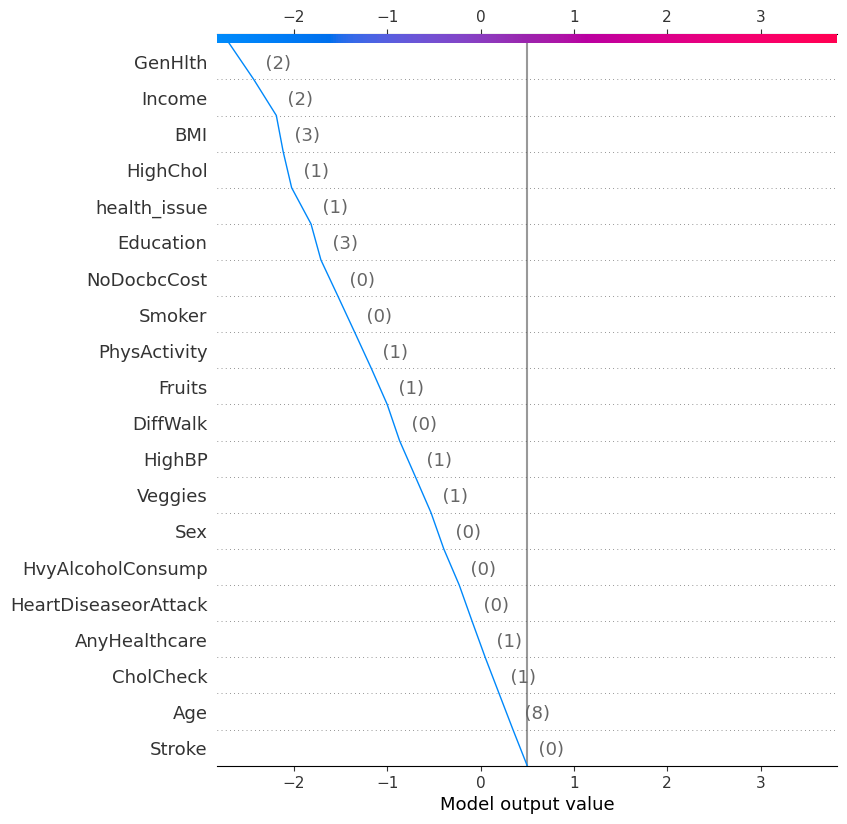

for row : 200  the real value is  0


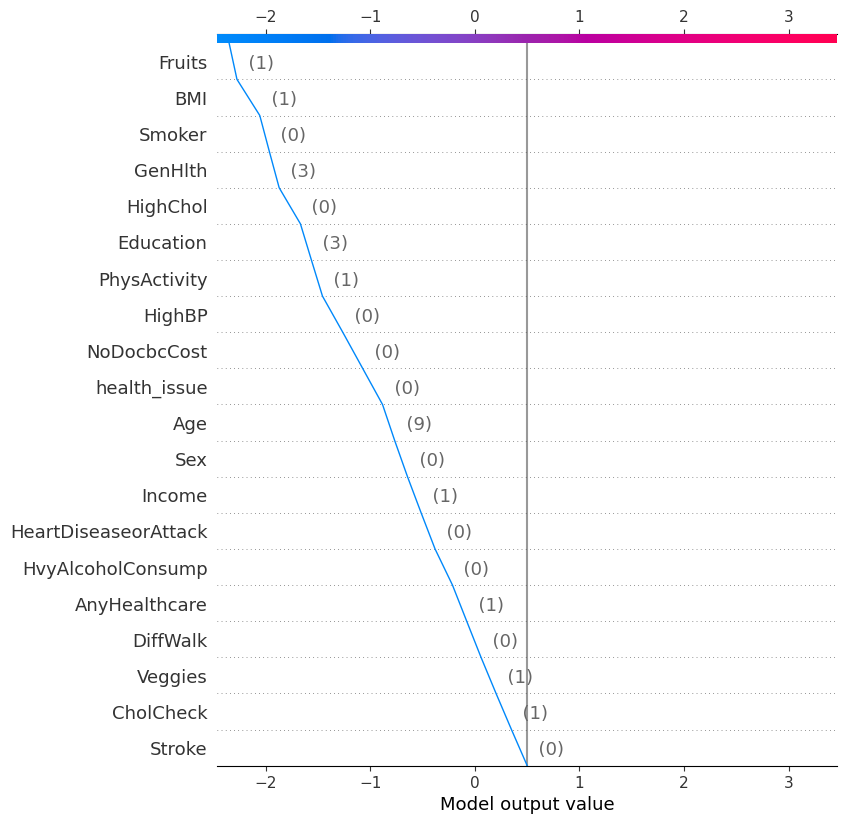

for row : 250  the real value is  0


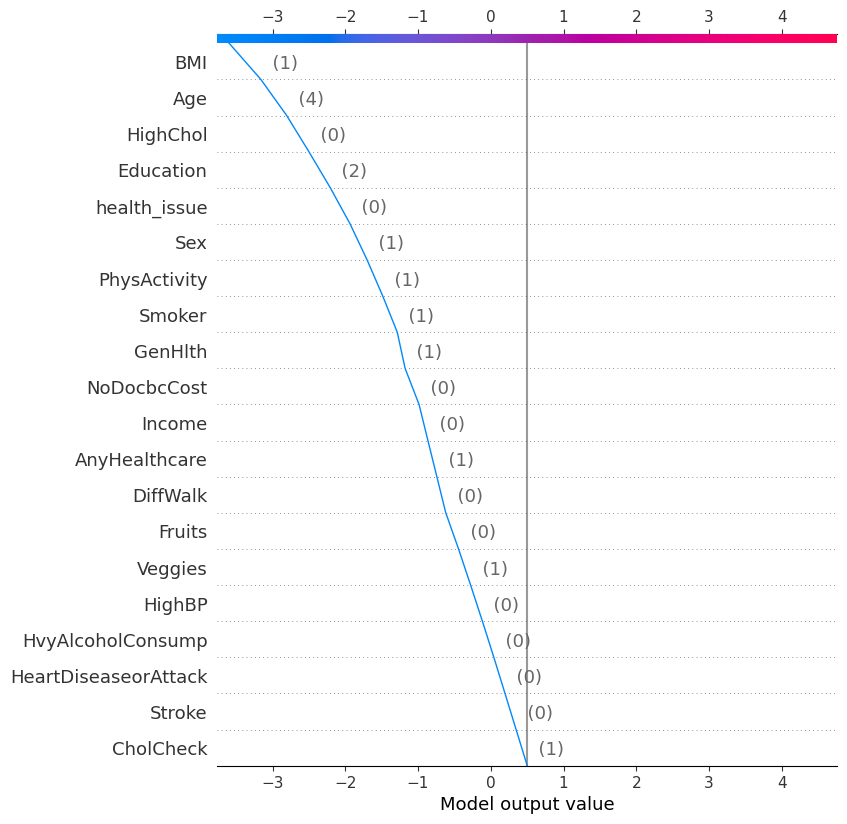

for row : 300  the real value is  2


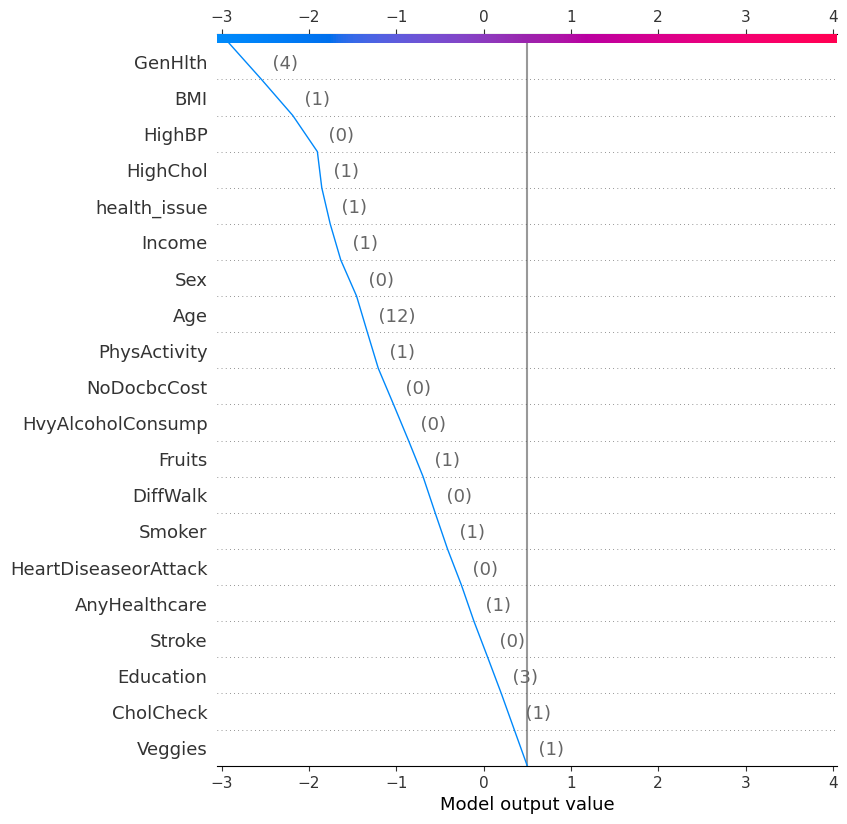

In [42]:
#Shap decision plot
for i in row:
    print("for row :",i," the real value is ", y_test.iloc[i])
    shap.decision_plot(
    base_value=shap_explainer.expected_value[1],
    shap_values=shap_values[1][i],
    features=X_test.iloc[i],
    feature_names=X_test.columns.tolist(),
    link="identity",
    new_base_value=0.5
    )

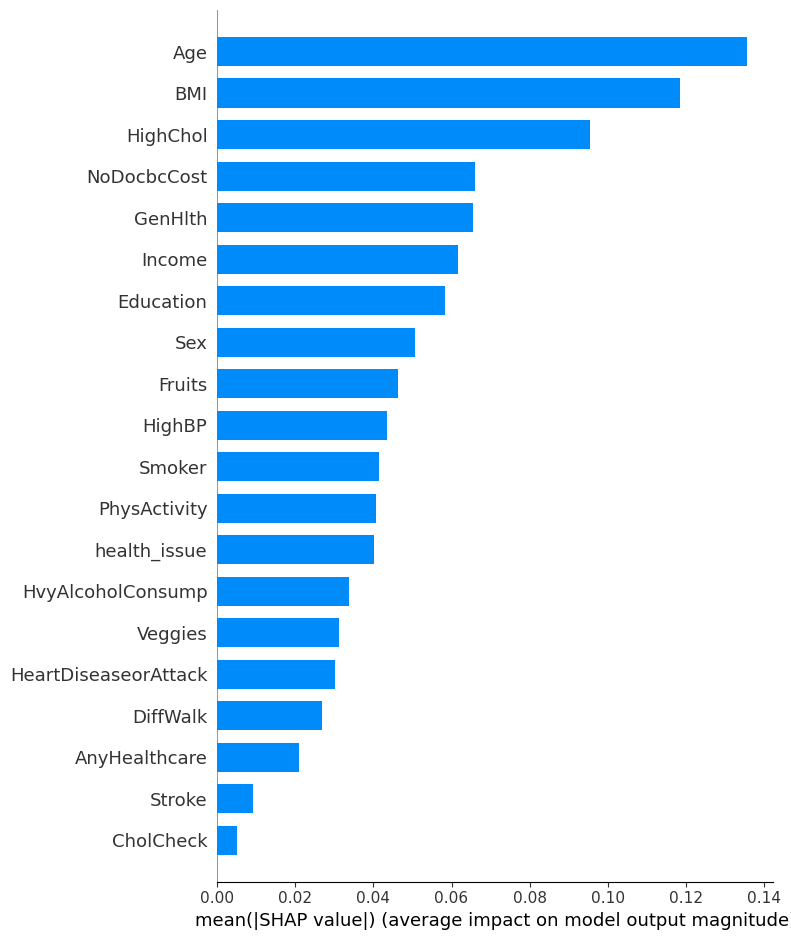

In [43]:
#bar chart
shap.summary_plot(shap_values = shap_values[1], features = X_test, max_display=20, plot_type='bar')

In [44]:
#summary plot of shap X_train
shap_values = shap_explainer.shap_values(X_train)

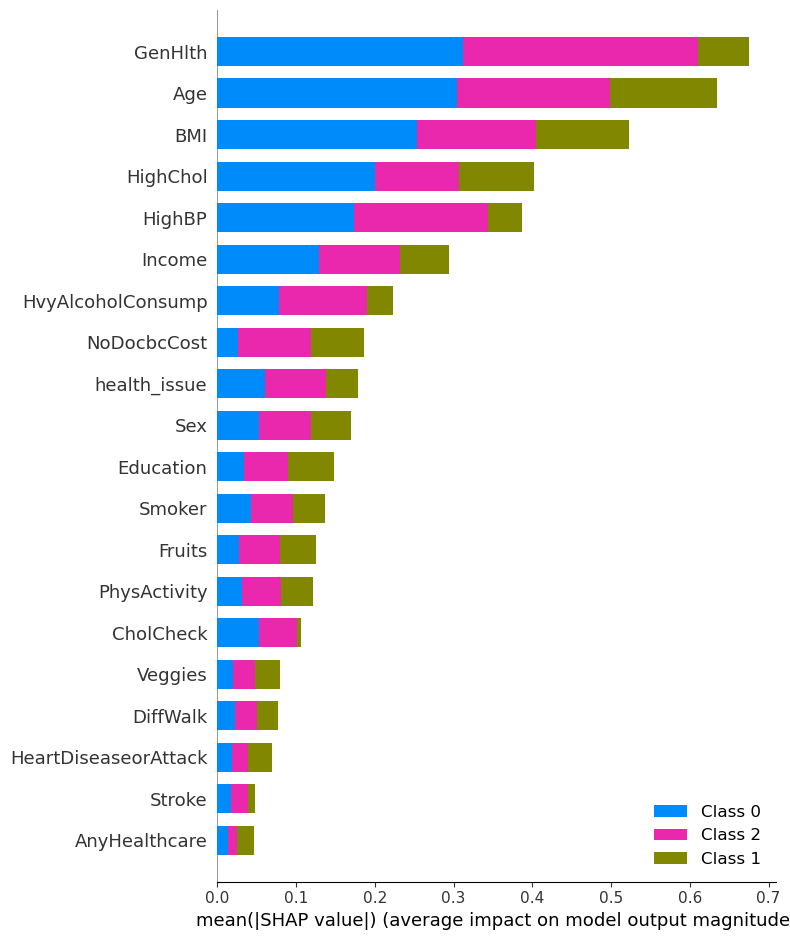

In [45]:
#shap summary plot of 
shap.summary_plot(shap_values, X_train, plot_type='bar')

# LIME

In [46]:
# importing Lime
import lime
import lime.lime_tabular
#using tabuar explainer of lime
lime_explainer = lime.lime_tabular.LimeTabularExplainer(
   X_train.values,
    training_labels=y_train.values,
    feature_names=X_train.columns.tolist(),
    feature_selection="auto",
    class_names  = ["0","1","2"],

)

In [47]:
#Explanations using lime
for i in row:
    print("for row :",i," the real value is ", y_test.iloc[i])
    exp = lime_explainer.explain_instance(X_test.iloc[i], cat_model.predict_proba, num_features=5)
    exp.show_in_notebook(show_table=True)

for row : 100  the real value is  0


for row : 150  the real value is  0


for row : 200  the real value is  0


for row : 250  the real value is  0


for row : 300  the real value is  2
